In [ ]:
import pandas as pd
from scipy.stats import poisson
import numpy as np
import seaborn as sns
import random

In [ ]:
data = pd.read_csv('C:/Users/79520/Desktop/processed_ok_all_restore_ext.csv', on_bad_lines='skip',sep = ";", header= None)

In [ ]:
data

,0,1,2,3,4
0,0,Пушкин Песочная 6 кв 12,59.729019,30.400148,ГБ №16
1,1,Будапештская 69 кор 2 кв 19,59.846138,30.386215,НИИ СП им. Джанелидзе
2,2,Петродворец Б Разведчика 14 кор 4 кв 38,59.876707,29.890929,ГБ №40
3,3,Солдата Корзуна 42 кв 73,59.831435,30.222416,НИИ СП им. Джанелидзе
4,4,"Стадион "" Петровский """,59.956949,30.276342,ГБ №1
...,...,...,...,...,...
5120,5120,"Курляндская ул., 32 - 81",59.911236,30.278570,ГБ №16
5121,5121,"Испытателей пр., 20 - 500",60.003745,30.292898,ГБ №2
5122,5122,"Олеко Дундича пр., 35-1",59.939095,30.315868,ГБ №26
5123,5123,"Академика Байкова ул., 17 - 1 - 125",60.026168,30.379316,ГБ №3


In [ ]:
data.columns = ['index', 'adress', 'lat', 'lon', 'final']

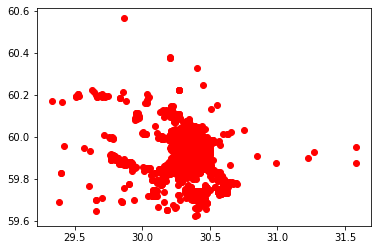

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(data.lon, data.lat, color="red") # plotting single point
plt.show()

In [ ]:
min_lon = data.lon.min()
max_lon = data.lon.max()
min_lat = data.lat.min()
max_lat = data.lat.max()

In [ ]:
max_lat

60.565524

In [ ]:
min_lat

59.623292

In [ ]:
max_lon

31.582142

In [ ]:
min_lon

29.330102

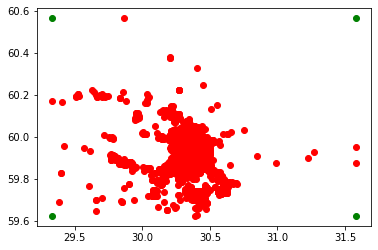

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(data.lon, data.lat, color="red") # plotting single point
plt.scatter(min_lon, min_lat, color = "green" )
plt.scatter(min_lon, max_lat, color = "green" )
plt.scatter(max_lon, max_lat, color = "green" )
plt.scatter(max_lon, min_lat, color = "green" )
plt.show()

In [ ]:
import plotly.express as px

In [ ]:
zero_hospitals = pd.read_csv('C:/Users/79520/Desktop/zero_hospitals.csv')

In [ ]:
zero_hospitals


,number,lat,lon,color
0,1,60.565524,29.330102,green
1,2,60.565524,31.582142,green
2,3,59.623292,31.582142,green
3,4,59.623292,29.330102,green


In [ ]:
zero_hospitals["color"] = 2

In [ ]:
zero_hospitals["size"] = 16

In [ ]:
fig = px.scatter_mapbox(data, 
                        lat="lat", 
                        lon="lon", 
                        #color="counts",
                        #color_continuous_scale=color_scale,
                        #size="counts",
                        zoom=8, 
                        height=800,
                        width=800)

fig2 = px.scatter_mapbox(zero_hospitals, lat="lat", lon="lon",zoom=8, color = zero_hospitals["color"], size = zero_hospitals["size"])
fig.add_trace(fig2.data[0]) # adds the line trace to the first figure
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
data['norm_lat'] = (data['lat'] - min_lat)/(max_lat - min_lat)

In [ ]:
data['norm_lon'] = (data['lon'] - min_lon)/(max_lon - min_lon)

In [ ]:
coordinates = data[['norm_lat', 'norm_lon']].to_numpy()

In [ ]:
coordinates

array([[0.11220909, 0.4751452 ],
       [0.23650863, 0.46895837],
       [0.26895181, 0.24903066],
       ...,
       [0.3351648 , 0.43772135],
       [0.42757622, 0.46589492],
       [0.26854427, 0.47563187]])

In [ ]:
coordinates[0]

array([0.11220909, 0.4751452 ])

In [ ]:
def generate_real_patient_simple():
  rng = np.random.default_rng()
  one_hospital = rng.choice(coordinates, 1)
  return one_hospital[0]

In [ ]:
generate_real_patient_simple()

array([0.25569287, 0.49999201])

In [ ]:
#print(one_hospital in coordinates)

### Модель

In [ ]:
class Hospital:
  def __init__(self, N_lim, servers, location, strategy, processing_speed):
    self.N_lim = N_lim
    self.servers = servers
    self.location = location
    self.strategy = strategy
    self.queue = 0
    self.total_patients = 0
    self.total_time = 0
    self.processing_speed = processing_speed
  def accept(self):
    if self.strategy == 'A':
      return True
    elif self.queue < self.N_lim:
      return True
    else:
      return False
  def sent_patient(self, patient):
    self.queue += 1
    self.total_patients +=1 
    self.total_time += manch_distance(patient, self.location)
    self.total_time += self.queue/ (self.servers*self.processing_speed)
  def next_round(self):
    self.queue -= self.servers*self.processing_speed
    self.queue = max(0, self.queue)
  def utility_simple(self): #utility
    if self.total_patients > 0:
      return self.total_patients/ self.total_time
    else:
      return 0 
  def p_m(self, t):
      return (0.000043 * t ** 2 + 0.0045 * t)/1000
  def utility_M1Y(self,  r = 1, e = 0, penalty = 0.01):
    # more complicated function
    if self.total_patients > 0:
      return self.total_patients*((1-self.p_m(self.total_time))*r - e) - (self.total_patients- self.total_patients*(1-self.p_m(self.total_time)))*penalty
    else:
      return 0
  def utility_high_M1Y(self,  r = 1, e = 0, penalty = 0.1):
  # more complicated function
    if self.total_patients > 0:
      return self.total_patients*((1-self.p_m(self.total_time))*r - e) - (self.total_patients- self.total_patients*(1-self.p_m(self.total_time)))*penalty
    else:
      return 0
  def utility_very_high_M1Y(self,  r = 1, e = 0, penalty = 0.25):
  # more complicated function
    if self.total_patients > 0:
      return self.total_patients*((1-self.p_m(self.total_time))*r - e) - (self.total_patients- self.total_patients*(1-self.p_m(self.total_time)))*penalty
    else:
      return 0
  def surv_number(self):
    return (self.total_patients*(1-self.p_m(self.total_time/num_roundes)))

In [ ]:
def manch_distance(start, end):
  distance_first = abs(end[0]-start[0])
  distance_second = abs(end[1]-start[1])
  return distance_first + distance_second

In [ ]:
def generate_uniform_patient():
  y=np.random.rand(2)
  return y

In [ ]:
def round_simulation(num_rounds, l, strategy, generate_patient, num_servers, mu, utility):
  total_patients = 0
  # utility: maps hospital to number
  h1 = Hospital(8, num_servers[0], (0,0), strategy[0], mu)
  h2 = Hospital(8, num_servers[1], (0,1), strategy[1], mu)
  h3 = Hospital(8, num_servers[2], (1,0), strategy[2], mu)
  h4 = Hospital(8, num_servers[3], (1,1), strategy[3], mu)
  for i in range(num_rounds):
    num_patients = poisson.rvs(mu=l, size=1)[0] # poisson with parameter l
    total_patients += num_patients
    for j in range(num_patients):
      patient = generate_patient()
      all_hospitals = [(h1, manch_distance(patient, h1.location)),
                       (h2, manch_distance(patient, h2.location)),
                       (h3, manch_distance(patient, h3.location)),
                       (h4, manch_distance(patient, h4.location))]
      all_hospitals_sorted = sorted(all_hospitals, key = lambda variable: variable[1])
      found_hospitals = False
      for h in all_hospitals_sorted:
        if h[0].accept():
          h[0].sent_patient(patient)
          found_hospitals = True
          break
      if not found_hospitals:
        all_hospitals_sorted[0][0].sent_patient(patient)
    h1.next_round()
    h2.next_round()
    h3.next_round()
    h4.next_round()
  return [[utility(h1), utility(h2), utility(h3), utility(h4)], (h1.surv_number() + h2.surv_number() + h3.surv_number() + h4.surv_number())/total_patients, (h1.total_time + h2.total_time + h3.total_time + h4.total_time)/total_patients]

In [ ]:
def is_equilibrium(matrix, strategies):
  num_players = len(strategies)
  for i in range (0, num_players):
    current_utility = matrix[tuple(strategies)][i]
    #print(current_utility)
    alt_strats = np.array(strategies)
    for j in range(0, matrix.shape[i]):
      alt_strats[i] = j
      if matrix[tuple(alt_strats)][i] > current_utility:
        return False
  return True

In [ ]:
num_roundes = 1000
num_patients = 3
num_servers = 4

In [ ]:
import numpy as np

In [ ]:
def generate_matrix(num_roundes, num_patients, num_servers, mu, generate_patient_function, utility):
  matrix = np.array([[[[round_simulation(num_roundes,num_patients, 'AAAA', generate_patient_function, num_servers, mu, utility )[0], round_simulation(num_roundes,num_patients, 'AAAR', generate_patient_function, num_servers, mu , utility)[0]], [round_simulation(num_roundes,num_patients, 'AARA', generate_patient_function, num_servers, mu, utility )[0], round_simulation(num_roundes,num_patients, 'AARR', generate_patient_function, num_servers, mu, utility )[0]]],
                            [[round_simulation(num_roundes,num_patients, 'ARAA', generate_patient_function, num_servers, mu, utility )[0], round_simulation(num_roundes,num_patients, 'ARAR', generate_patient_function, num_servers, mu , utility)[0]], [round_simulation(num_roundes,num_patients, 'ARRA', generate_patient_function, num_servers, mu, utility )[0], round_simulation(num_roundes,num_patients, 'ARRR', generate_patient_function, num_servers, mu, utility )[0]]]],
                           [[[round_simulation(num_roundes,num_patients, 'RAAA', generate_patient_function, num_servers, mu, utility )[0], round_simulation(num_roundes,num_patients,  'RAAR', generate_patient_function, num_servers, mu, utility )[0]], [round_simulation(num_roundes,num_patients, 'RARA', generate_patient_function, num_servers, mu, utility )[0], round_simulation(num_roundes,num_patients, 'RARR', generate_patient_function, num_servers, mu, utility )[0]]],
                            [[round_simulation(num_roundes,num_patients, 'RRAA', generate_patient_function, num_servers, mu, utility )[0], round_simulation(num_roundes,num_patients,  'RRAR', generate_patient_function, num_servers, mu, utility )[0]], [round_simulation(num_roundes,num_patients, 'RRRA', generate_patient_function, num_servers, mu, utility )[0], round_simulation(num_roundes,num_patients, 'RRRR', generate_patient_function, num_servers, mu, utility )[0]]]]])
  return matrix


In [ ]:
def number_to_letter(numbers):
  s = ''
  for i in numbers:
    if i == 0:
      s += 'A'
    else:
      s += 'R'
  return s

In [ ]:
def find_solution(l, mu, n):
    G = generate_matrix(num_roundes , l, n, mu,generate_real_patient_simple, lambda hospital : hospital.utility_simple())
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
hue_order = ['AAAA', 'AAAR', 'AARA', 'ARAA', 'RAAA', 'ARAR', 'RARA', 'RAAR', 'ARRA', 'RRAA', 'AARR', 'ARRR', 'RARR', 'RRAR', 'RRRA','RRRR','Inconsistent']

In [ ]:
palette = sns.color_palette("coolwarm", n_colors=17)

In [ ]:
def solution_plot(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Initial Solution Plot')
    if ax is not None:
        ax.set_title('N = ' + str(n))
     

### Uniform distribution

In [ ]:
def find_solution_uniform_simple(l, mu, n):
    G = generate_matrix(num_roundes , l, n, mu,generate_uniform_patient, lambda hospital : hospital.utility_simple())
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def solution_plot_uniform_simple(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_uniform_simple(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Initial Solution Plot')
    if ax is not None:
        ax.set_title('N = ' + str(n))

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 41min 3s


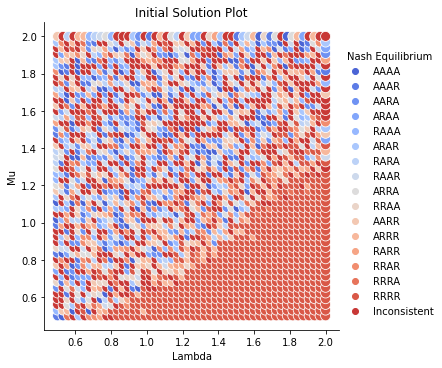

In [ ]:
%%time
solution_plot_uniform_simple([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 55min 8s


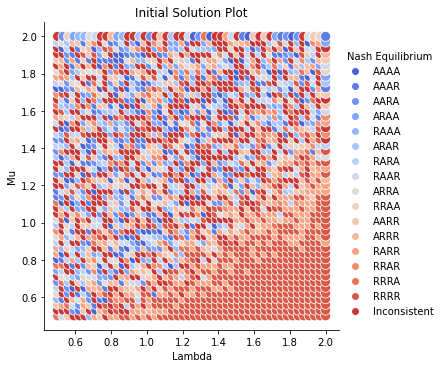

In [ ]:
%%time
solution_plot_uniform_simple([1,2,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


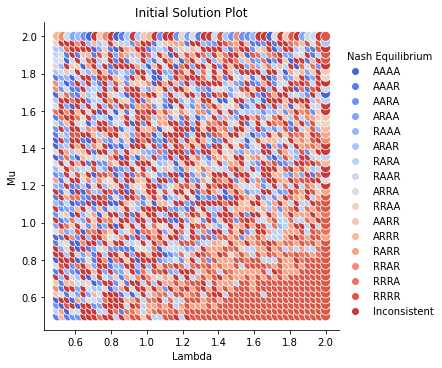

In [ ]:
solution_plot_uniform_simple([1,2,1,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


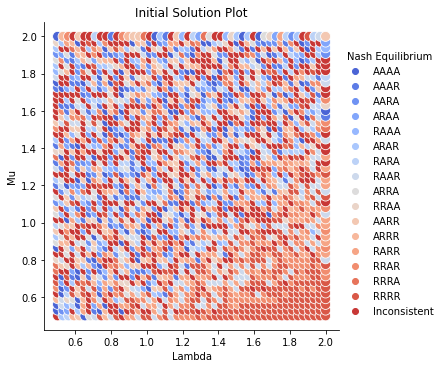

In [ ]:
solution_plot_uniform_simple([1,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 38min 22s


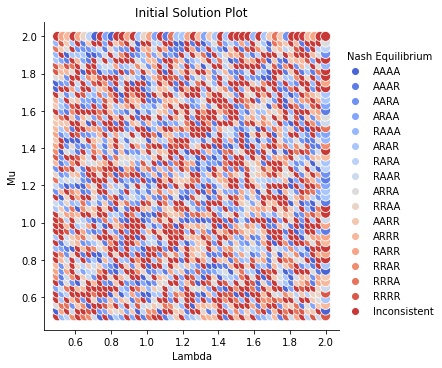

In [ ]:
%%time
solution_plot_uniform_simple([3,3,3,3], legend='brief')

In [ ]:
def solution_plot_uniform_simple_high_lambda(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 4, 50):
        for mu in np.linspace(0.5, 4, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_uniform_simple(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Initial Solution Plot')
    if ax is not None:
        ax.set_title('N = ' + str(n))

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 51min 57s


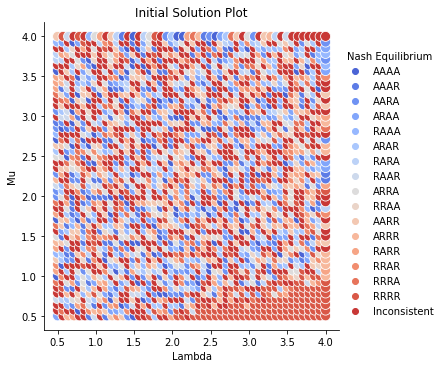

In [ ]:
%%time
solution_plot_uniform_simple_high_lambda([3,3,3,3], legend='brief')

In [ ]:
def find_solution_uniform_m1y(l, mu, n):
    G = generate_matrix(num_roundes , l, n, mu,generate_uniform_patient, lambda hospital : hospital.utility_M1Y())
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def solution_plot_uniform_m1y(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_uniform_m1y(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Solution Plot with Financial Model')
    if ax is not None:
        ax.set_title('N = ' + str(n))

In [ ]:
def find_solution_uniform_m1y_middle_penalty(l, mu, n):
    G = generate_matrix(num_roundes , l, n, mu,generate_uniform_patient, lambda hospital : hospital.utility_high_M1Y())
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def solution_plot_uniform_m1y_middle_penalty(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_uniform_m1y_middle_penalty(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Solution Plot with Financial Model with penalty=0.1')
    if ax is not None:
        ax.set_title('N = ' + str(n))

In [ ]:
def find_solution_uniform_m1y_very_high_penalty(l, mu, n):
    G = generate_matrix(num_roundes , l, n, mu,generate_uniform_patient, lambda hospital : hospital.utility_very_high_M1Y())
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def solution_plot_uniform_m1y_very_high_penalty(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_uniform_m1y_very_high_penalty(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Solution Plot with Financial Model with penalty=0.25')
    if ax is not None:
        ax.set_title('N = ' + str(n))

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 37min 47s


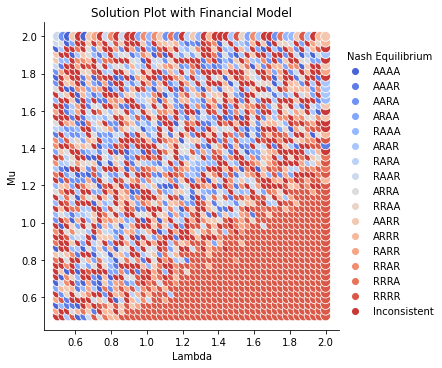

In [ ]:
%%time
solution_plot_uniform_m1y([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


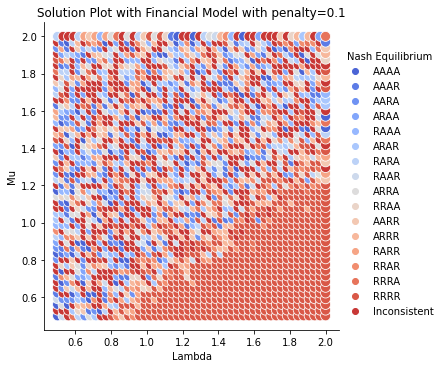

In [ ]:
solution_plot_uniform_m1y_middle_penalty([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


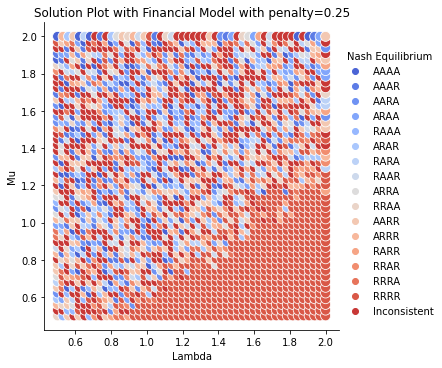

In [ ]:
solution_plot_uniform_m1y_very_high_penalty([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 38min 52s


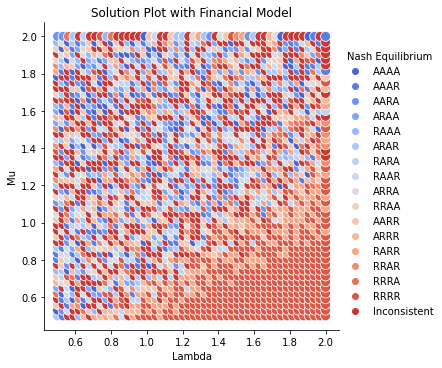

In [ ]:
%%time
solution_plot_uniform_m1y([1,2,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


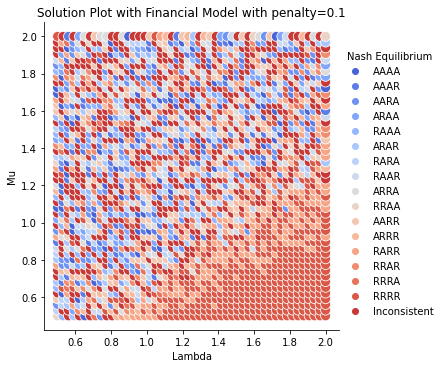

In [ ]:
solution_plot_uniform_m1y_middle_penalty([1,2,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


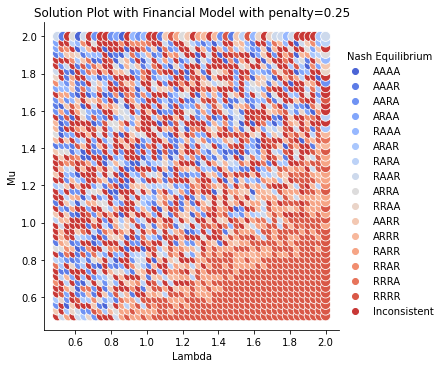

In [ ]:
solution_plot_uniform_m1y_very_high_penalty([1,2,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


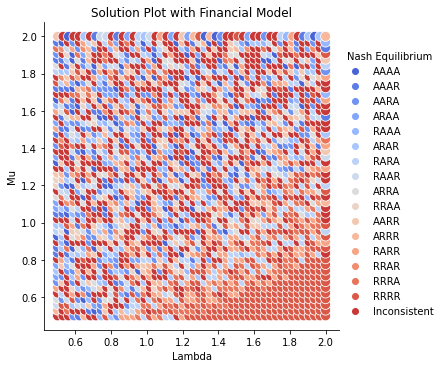

In [ ]:
solution_plot_uniform_m1y([1,2,1,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


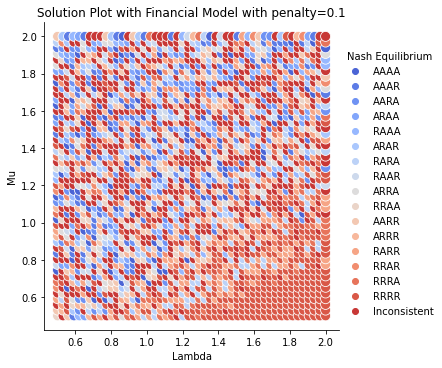

In [ ]:
solution_plot_uniform_m1y_middle_penalty([1,2,1,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


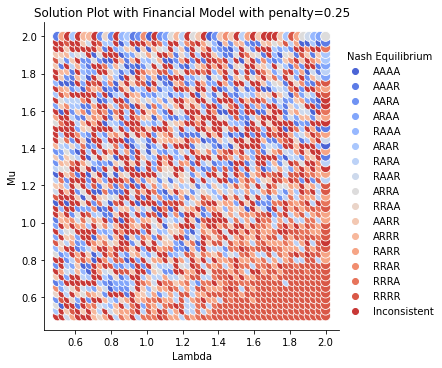

In [ ]:
solution_plot_uniform_m1y_very_high_penalty([1,2,1,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


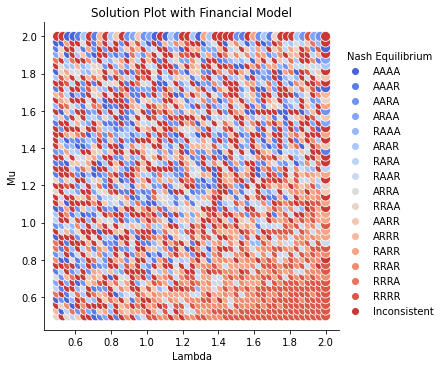

In [ ]:
solution_plot_uniform_m1y([1,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


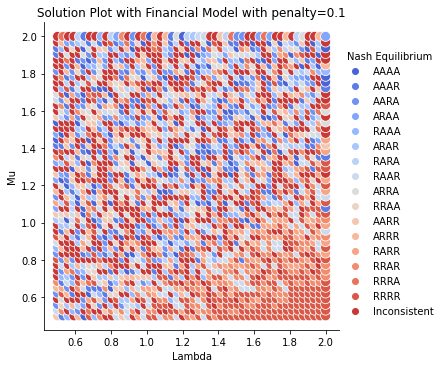

In [ ]:
solution_plot_uniform_m1y_middle_penalty([1,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


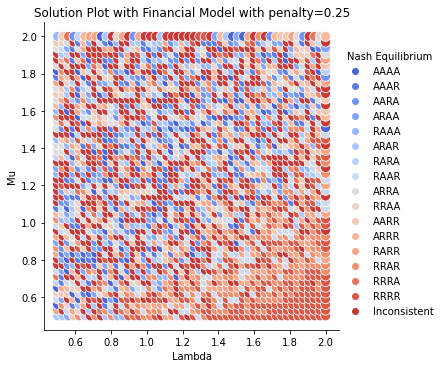

In [ ]:
solution_plot_uniform_m1y_very_high_penalty([1,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 37min 34s


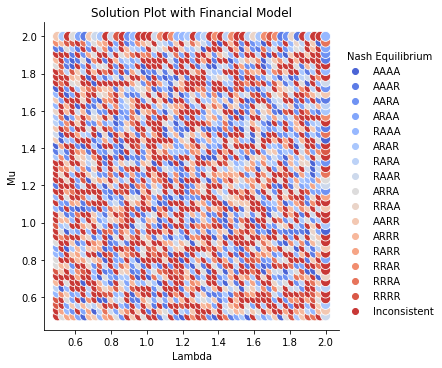

In [ ]:
%%time
solution_plot_uniform_m1y([3,3,3,3], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


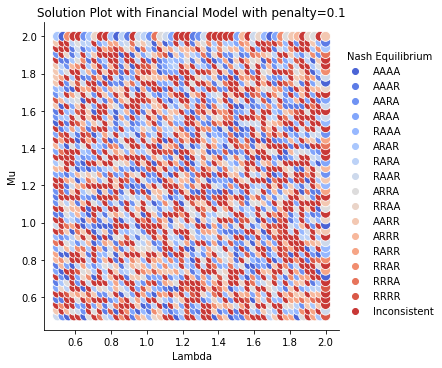

In [ ]:
solution_plot_uniform_m1y_middle_penalty([3,3,3,3], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


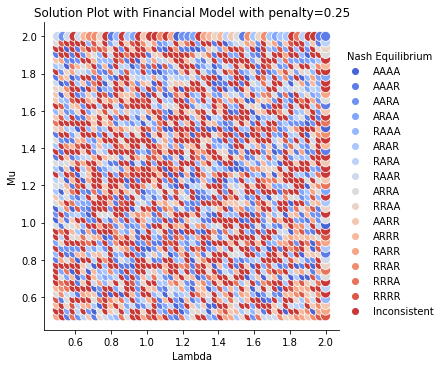

In [ ]:
solution_plot_uniform_m1y_very_high_penalty([3,3,3,3], legend='brief')

In [ ]:
def solution_plot_uniform_m1y_high_lambda(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(2, 4, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_uniform_m1y(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Solution Plot with Financial Model')
    if ax is not None:
        ax.set_title('N = ' + str(n))

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 48min 44s


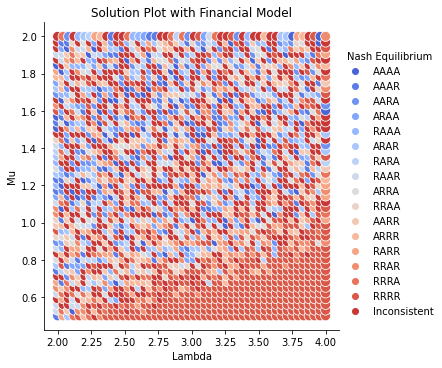

In [ ]:
%%time
solution_plot_uniform_m1y_high_lambda([3,3,3,3], legend='brief')

#### Survival rate

In [ ]:
def global_plot_survival(num_servers, ax, mu=1, N_lim=5, t_c=10):
    data = {
        'Patients Inflow': [],
        'Survival rate': [],
        'Strategy': []
    }
    l_space = np.linspace(1, 5, 50)
    desired_strategies = ['AAAA', 'RAAA', 'RRAA', 'ARRR', 'RRRR']
    for l in l_space:
        for strat in desired_strategies:
            data['Patients Inflow'].append(l)
            data['Survival rate'].append(round_simulation(num_roundes, l, strat, generate_uniform_patient,num_servers, mu,lambda hospital : hospital.utility_simple())[1])
            data['Strategy'].append(strat)

        
        
    data = pd.DataFrame(data)
    sns.lineplot(x="Patients Inflow", y="Survival rate", hue="Strategy", data=data, ax=ax)
    ax.set_title('Server N = ' + str(num_servers))

In [ ]:
num_roundes = 1000
num_patients = 3
num_servers = 4

Wall time: 42.2 s


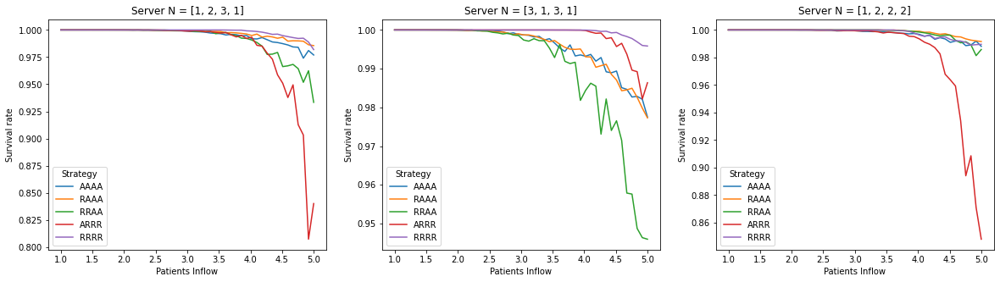

In [ ]:

%%time
N_lim= 8
fig, axs = plt.subplots(ncols=3, figsize=(20, 5))
global_plot_survival([1,2,3,1], axs[0], mu=0.5, N_lim=N_lim)
global_plot_survival([3,1,3,1], axs[1], mu=0.5, N_lim=N_lim)
global_plot_survival([1,2,2,2], axs[2], mu=0.5, N_lim=N_lim)

Wall time: 50 s


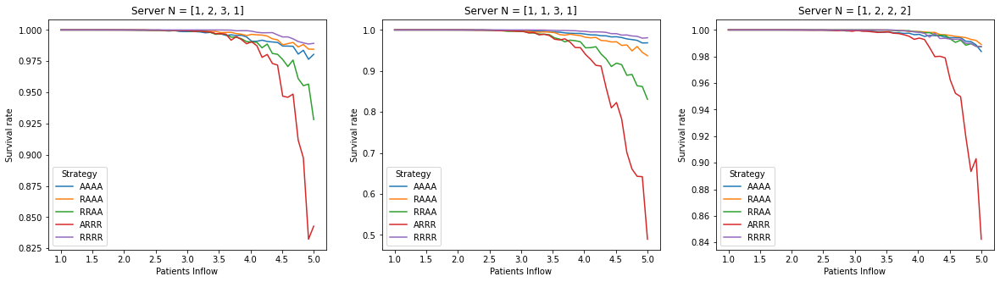

In [ ]:

%%time
N_lim= 8
fig, axs = plt.subplots(ncols=3, figsize=(20, 5))
global_plot_survival([1,2,3,1], axs[0], mu=0.5, N_lim=N_lim)
global_plot_survival([1,1,3,1], axs[1], mu=0.5, N_lim=N_lim)
global_plot_survival([1,2,2,2], axs[2], mu=0.5, N_lim=N_lim)

In [ ]:
def global_plot_time(num_servers, ax, mu=1, N_lim=5, t_c=10):
    data = {
        'Patients Inflow': [],
        'Global time': [],
        'Strategy': []
    }
    l_space = np.linspace(1, 5, 50)
    desired_strategies = ['AAAA', 'RAAA', 'RRAA', 'ARRR', 'RRRR']
    for l in l_space:
        for strat in desired_strategies:
            data['Patients Inflow'].append(l)
            data['Global time'].append(round_simulation(num_roundes, l, strat, generate_uniform_patient,num_servers, mu,lambda hospital : hospital.utility_simple())[2])
            data['Strategy'].append(strat)

        
        
    data = pd.DataFrame(data)
    sns.lineplot(x="Patients Inflow", y="Global time", hue="Strategy", data=data, ax=ax)
    ax.set_title('Server N = ' + str(num_servers))

Wall time: 41.9 s


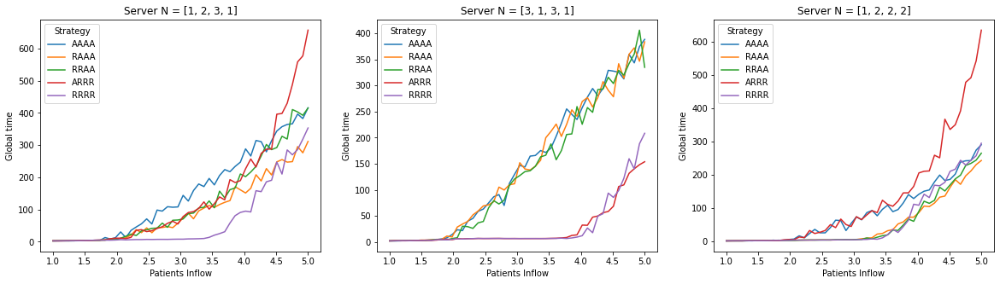

In [ ]:

%%time
N_lim= 8
fig, axs = plt.subplots(ncols=3, figsize=(20, 5))
global_plot_time([1,2,3,1], axs[0], mu=0.5, N_lim=N_lim)
global_plot_time([3,1,3,1], axs[1], mu=0.5, N_lim=N_lim)
global_plot_time([1,2,2,2], axs[2], mu=0.5, N_lim=N_lim)

### Real data based (полные данные)

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 13h 42min 27s


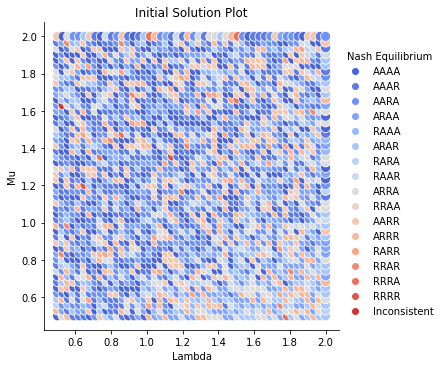

In [ ]:
%%time
solution_plot([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


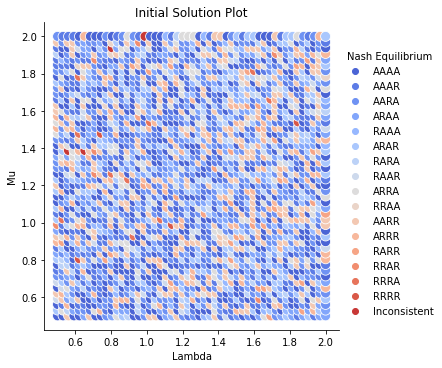

In [ ]:
solution_plot([1,2,1,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


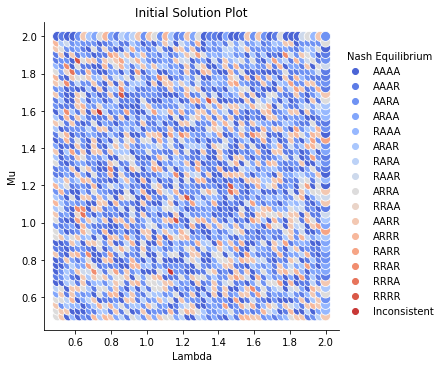

In [ ]:
solution_plot([1,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


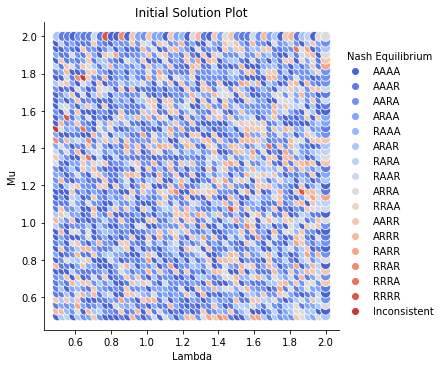

In [ ]:
solution_plot([1,2,4,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


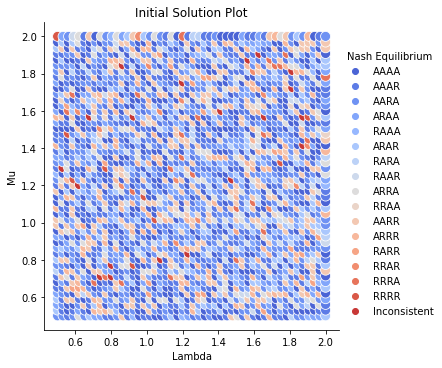

In [ ]:
solution_plot([3,3,3,3], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


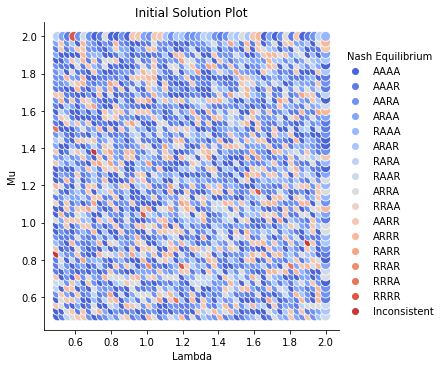

In [ ]:
solution_plot([1,3,2,3], legend='brief')

In [ ]:
def find_solution_real_patient_simple_m1y(l, mu, n):
    G = generate_matrix(num_roundes , l, n, mu,generate_real_patient_simple, lambda hospital : hospital.utility_M1Y())
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def solution_plot_real_patient_simple_m1y(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_real_patient_simple_m1y(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Solution Plot with Financial Model')
    if ax is not None:
        ax.set_title('N = ' + str(n))

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 1h 51min 46s


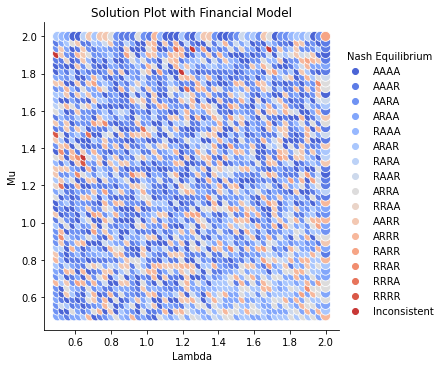

In [ ]:
%%time
solution_plot_real_patient_simple_m1y([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


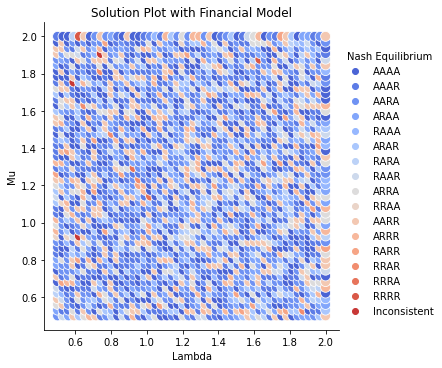

In [ ]:
solution_plot_real_patient_simple_m1y([1,2,1,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


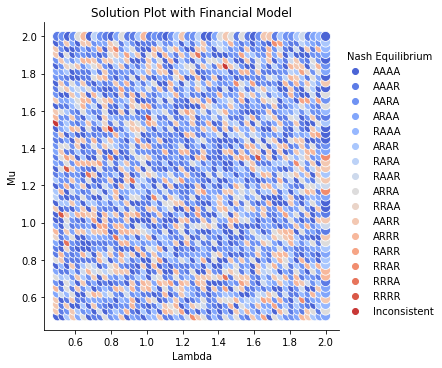

In [ ]:
solution_plot_real_patient_simple_m1y([1,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


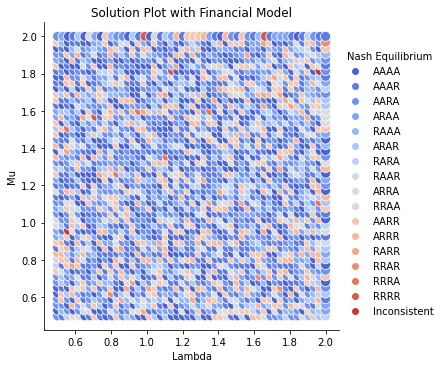

In [ ]:
solution_plot_real_patient_simple_m1y([1,2,4,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


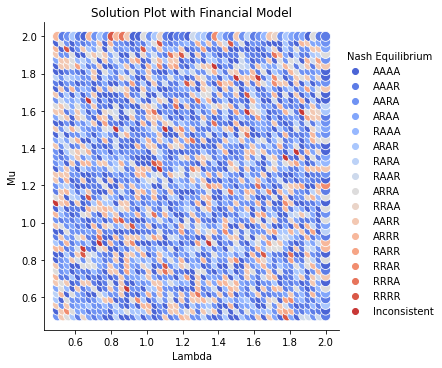

In [ ]:
solution_plot_real_patient_simple_m1y([3,3,3,3], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


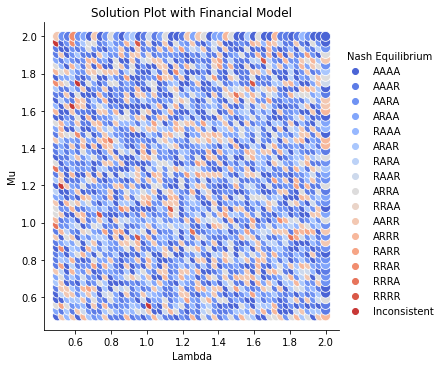

In [ ]:
solution_plot_real_patient_simple_m1y([1,3,2,3], legend='brief')

### Вариант с обрезанными данными

#### data prep

In [ ]:
data_filtered_lon = data[data['lat'] <= 60.25]

In [ ]:
data

,index,adress,lat,lon,final,norm_lat,norm_lon
0,0,Пушкин Песочная 6 кв 12,59.729019,30.400148,ГБ №16,0.112209,0.475145
1,1,Будапештская 69 кор 2 кв 19,59.846138,30.386215,НИИ СП им. Джанелидзе,0.236509,0.468958
2,2,Петродворец Б Разведчика 14 кор 4 кв 38,59.876707,29.890929,ГБ №40,0.268952,0.249031
3,3,Солдата Корзуна 42 кв 73,59.831435,30.222416,НИИ СП им. Джанелидзе,0.220904,0.396225
4,4,"Стадион "" Петровский """,59.956949,30.276342,ГБ №1,0.354113,0.420170
...,...,...,...,...,...,...,...
5120,5120,"Курляндская ул., 32 - 81",59.911236,30.278570,ГБ №16,0.305598,0.421159
5121,5121,"Испытателей пр., 20 - 500",60.003745,30.292898,ГБ №2,0.403778,0.427522
5122,5122,"Олеко Дундича пр., 35-1",59.939095,30.315868,ГБ №26,0.335165,0.437721
5123,5123,"Академика Байкова ул., 17 - 1 - 125",60.026168,30.379316,ГБ №3,0.427576,0.465895


In [ ]:
 data_filtered = data_filtered_lon[data_filtered_lon['lon'] <= 30.6]

In [ ]:
filtered_min_lon = data_filtered.lon.min()
filtered_max_lon = data_filtered.lon.max()
filtered_min_lat = data_filtered.lat.min()
filtered_max_lat = data_filtered.lat.max()

In [ ]:
filtered_min_lon

29.330102

In [ ]:
data_filtered

,index,adress,lat,lon,final,norm_lat,norm_lon
0,0,Пушкин Песочная 6 кв 12,59.729019,30.400148,ГБ №16,0.112209,0.475145
1,1,Будапештская 69 кор 2 кв 19,59.846138,30.386215,НИИ СП им. Джанелидзе,0.236509,0.468958
2,2,Петродворец Б Разведчика 14 кор 4 кв 38,59.876707,29.890929,ГБ №40,0.268952,0.249031
3,3,Солдата Корзуна 42 кв 73,59.831435,30.222416,НИИ СП им. Джанелидзе,0.220904,0.396225
4,4,"Стадион "" Петровский """,59.956949,30.276342,ГБ №1,0.354113,0.420170
...,...,...,...,...,...,...,...
5120,5120,"Курляндская ул., 32 - 81",59.911236,30.278570,ГБ №16,0.305598,0.421159
5121,5121,"Испытателей пр., 20 - 500",60.003745,30.292898,ГБ №2,0.403778,0.427522
5122,5122,"Олеко Дундича пр., 35-1",59.939095,30.315868,ГБ №26,0.335165,0.437721
5123,5123,"Академика Байкова ул., 17 - 1 - 125",60.026168,30.379316,ГБ №3,0.427576,0.465895


In [ ]:
data_filtered['norm_filt_lat'] = (data_filtered['lat'] - filtered_min_lat)/(filtered_max_lat - filtered_min_lat)

C:\Users\79520\AppData\Local\Temp/ipykernel_14904/3362769687.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['norm_filt_lat'] = (data_filtered['lat'] - filtered_min_lat)/(filtered_max_lat - filtered_min_lat)


In [ ]:
data_filtered['norm_filt_lon'] = (data_filtered['lon'] - filtered_min_lon)/(filtered_max_lon - filtered_min_lon)

C:\Users\79520\AppData\Local\Temp/ipykernel_14904/1339238844.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['norm_filt_lon'] = (data_filtered['lon'] - filtered_min_lon)/(filtered_max_lon - filtered_min_lon)


In [ ]:
data_filtered

,index,adress,lat,lon,final,norm_lat,norm_lon,norm_filt_lat,norm_filt_lon
0,0,Пушкин Песочная 6 кв 12,59.729019,30.400148,ГБ №16,0.112209,0.475145,0.169349,0.843820
1,1,Будапештская 69 кор 2 кв 19,59.846138,30.386215,НИИ СП им. Джанелидзе,0.236509,0.468958,0.356944,0.832832
2,2,Петродворец Б Разведчика 14 кор 4 кв 38,59.876707,29.890929,ГБ №40,0.268952,0.249031,0.405908,0.442258
3,3,Солдата Корзуна 42 кв 73,59.831435,30.222416,НИИ СП им. Джанелидзе,0.220904,0.396225,0.333394,0.703663
4,4,"Стадион "" Петровский """,59.956949,30.276342,ГБ №1,0.354113,0.420170,0.534436,0.746188
...,...,...,...,...,...,...,...,...,...
5120,5120,"Курляндская ул., 32 - 81",59.911236,30.278570,ГБ №16,0.305598,0.421159,0.461215,0.747945
5121,5121,"Испытателей пр., 20 - 500",60.003745,30.292898,ГБ №2,0.403778,0.427522,0.609392,0.759244
5122,5122,"Олеко Дундича пр., 35-1",59.939095,30.315868,ГБ №26,0.335165,0.437721,0.505838,0.777358
5123,5123,"Академика Байкова ул., 17 - 1 - 125",60.026168,30.379316,ГБ №3,0.427576,0.465895,0.645308,0.827392


In [ ]:
coordinates_filtered = data_filtered[['norm_filt_lat', 'norm_filt_lon']].to_numpy()

In [ ]:
coordinates_filtered

array([[0.16934854, 0.84381964],
       [0.35694424, 0.83283232],
       [0.40590823, 0.44225841],
       ...,
       [0.50583839, 0.7773579 ],
       [0.64530782, 0.82739189],
       [0.40529315, 0.84468393]])

In [ ]:
def generate_real_patient_simple_filtered():
  rng = np.random.default_rng()
  one_hospital = rng.choice(coordinates_filtered, 1)
  return one_hospital[0]

In [ ]:
generate_real_patient_simple_filtered()

array([0.38663433, 0.7837123 ])

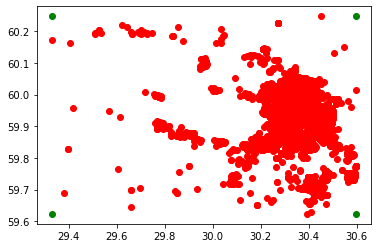

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(data_filtered.lon, data_filtered.lat, color="red") # plotting single point
plt.scatter(filtered_min_lon, filtered_min_lat, color = "green" )
plt.scatter(filtered_min_lon, filtered_max_lat, color = "green" )
plt.scatter(filtered_max_lon, filtered_max_lat, color = "green" )
plt.scatter(filtered_max_lon, filtered_min_lat, color = "green" )
plt.show()

In [ ]:
import os  
os.makedirs('content/', exist_ok=True)  

In [ ]:
data_filtered.to_csv('content/filtered_data.csv')

In [ ]:
import plotly.express as px

In [ ]:
fig = px.scatter_mapbox(df, 
                        lat="lat", 
                        lon="lon", 
                        #color="counts",
                        #color_continuous_scale=color_scale,
                        #size="counts",
                        zoom=8, 
                        height=800,
                        width=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

#### model 

In [ ]:
def find_solution_filtered(l, mu, n):
    G = generate_matrix(num_roundes , l, n, mu,generate_real_patient_simple_filtered, lambda hospital : hospital.utility_simple() )
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def solution_plot_filtered(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_filtered(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Initial Solution Plot')
    if ax is not None:
        ax.set_title('N = ' + str(n))

In [ ]:
num_roundes = 1000
num_patients = 3
num_servers = 4

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 1h 48min 55s


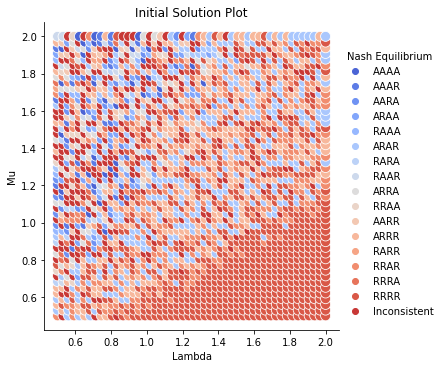

In [ ]:
%%time
solution_plot_filtered([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


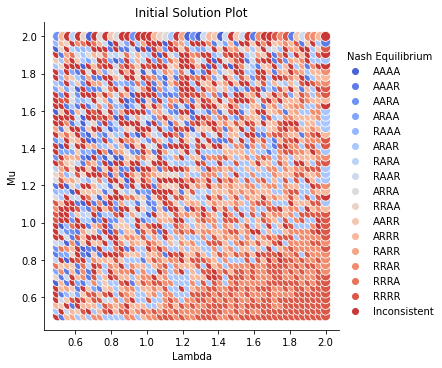

In [ ]:
solution_plot_filtered([1,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


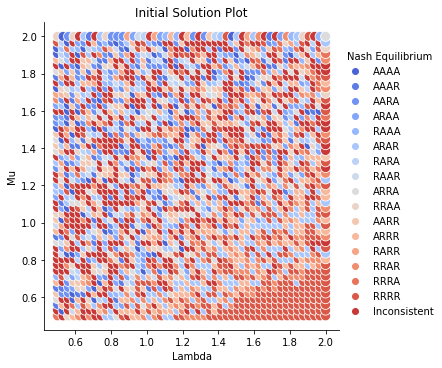

In [ ]:
solution_plot_filtered([1,2,1,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


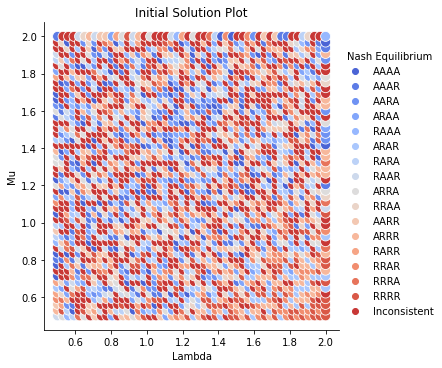

In [ ]:
solution_plot_filtered([1,3,2,3], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


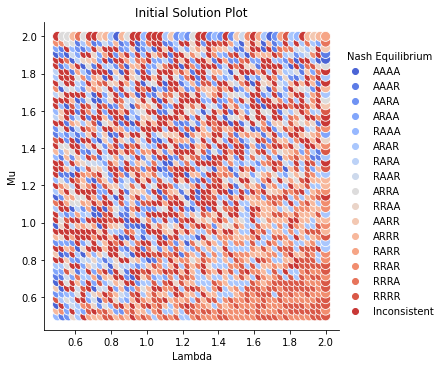

In [ ]:
solution_plot_filtered([1,2,4,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


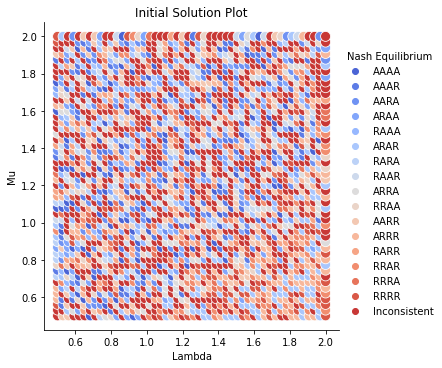

In [ ]:
solution_plot_filtered([3,3,3,3], legend='brief')

In [ ]:
def find_solution_filtered_m1y(l, mu, n):
    G = generate_matrix(num_roundes , l, n, mu,generate_real_patient_simple_filtered, lambda hospital: hospital.utility_M1Y())
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def solution_plot_filtered_m1y(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 5, 50):
        for mu in np.linspace(0.5, 5, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_filtered_m1y(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Solution Plot with Financial Model')
    if ax is not None:
        ax.set_title('N = ' + str(n))

In [ ]:
num_roundes = 1000
num_patients = 3
num_servers = 4

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 3h 13min 54s


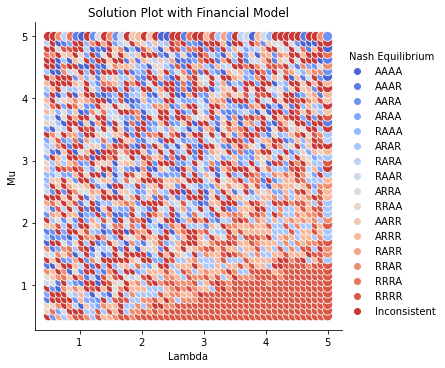

In [ ]:
%%time
solution_plot_filtered_m1y([1,1,1,1], legend='brief') # penalty 0.1

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 3h 32min 54s


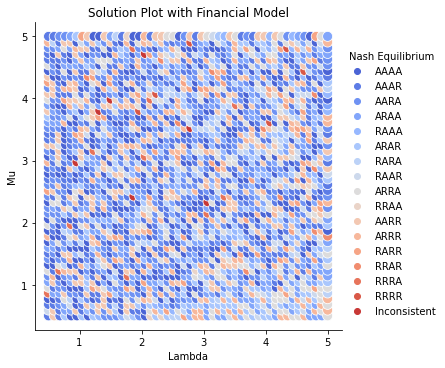

In [ ]:
%%time
solution_plot_filtered_m1y([1,2,3,1], legend='brief') # penalty 0.01

In [ ]:
%%time
solution_plot_filtered_m1y([1,2,1,2], legend='brief') # penalty 0.01

In [ ]:
%%time
solution_plot_filtered_m1y([1,3,2,3], legend='brief') # penalty 0.01

KeyboardInterrupt: 

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 4h 19min 16s


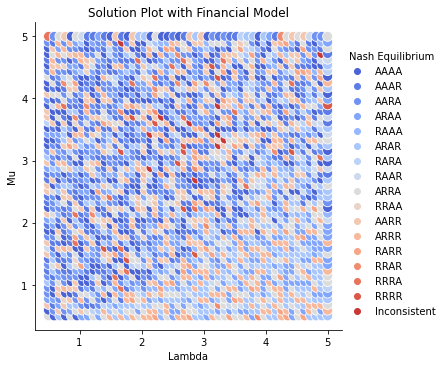

In [ ]:
%%time
solution_plot_filtered_m1y([3,3,3,3], legend='brief') # penalty 0.01

In [ ]:
def solution_plot_filtered_m1y_high(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(2.5, 10, 50):
        for mu in np.linspace(2.5, 10, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_filtered_m1y(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Initial Solution Plot')
    if ax is not None:
        ax.set_title('N = ' + str(n))

/usr/local/lib/python3.8/dist-packages/seaborn/relational.py:943: UserWarning:

relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot



CPU times: user 52min 21s, sys: 39.1 s, total: 53min 1s
Wall time: 53min


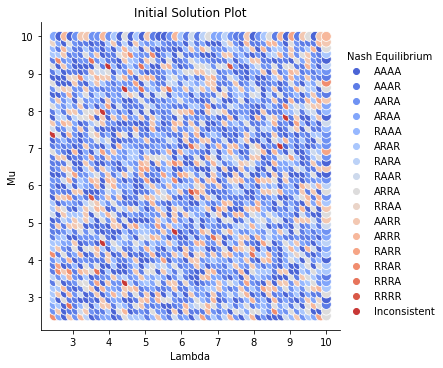

In [ ]:
%%time
solution_plot_filtered_m1y_high([5,5,5,5], legend='brief') # penalty 0.01

In [ ]:
def solution_plot_filtered_m1y_very_high(n, ax=None, legend=False):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(9.5, 12, 50):
        for mu in np.linspace(9.5, 12, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_filtered_m1y(l, mu, n))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Initial Solution Plot')
    if ax is not None:
        ax.set_title('N = ' + str(n))

/usr/local/lib/python3.8/dist-packages/seaborn/relational.py:943: UserWarning:

relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot



CPU times: user 2h 16min 12s, sys: 2min 34s, total: 2h 18min 46s
Wall time: 2h 19min 7s


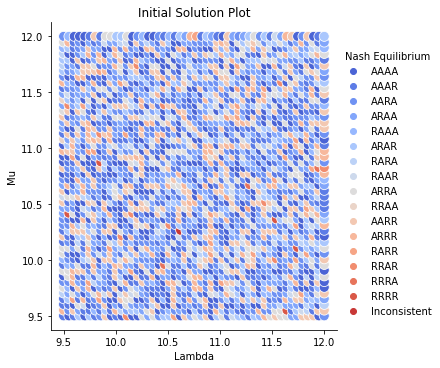

In [ ]:
%%time
solution_plot_filtered_m1y_very_high([3,3,3,3], legend='brief') # penalty 0.01

In [ ]:
%%time
solution_plot_filtered_m1y_very_high([3,5,5,1], legend='brief') # penalty 0.01

#### Survival rate

In [ ]:
def global_plot_survival_filtered(num_servers, ax, mu=1, N_lim=5, t_c=10):
    data = {
        'Patients Inflow': [],
        'Survival rate': [],
        'Strategy': []
    }
    l_space = np.linspace(1, 2, 50)
    desired_strategies = ['AAAA', 'RAAA', 'RRAA', 'ARRR', 'RRRR']
    for l in l_space:
        for strat in desired_strategies:
            data['Patients Inflow'].append(l)
            data['Survival rate'].append(round_simulation(num_roundes, l, strat, generate_real_patient_simple_filtered,num_servers, mu,lambda hospital : hospital.utility_simple())[1])
            data['Strategy'].append(strat)

        
        
    data = pd.DataFrame(data)
    sns.lineplot(x="Patients Inflow", y="Survival rate", hue="Strategy", data=data, ax=ax)
    ax.set_title('Server N = ' + str(num_servers))

Wall time: 4min 29s


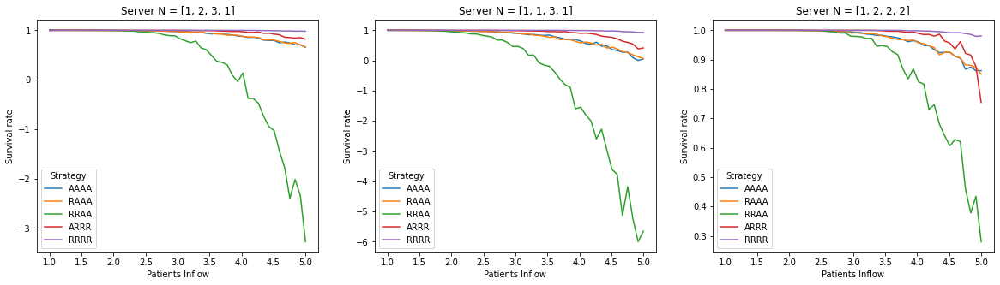

In [ ]:

%%time
N_lim= 8
fig, axs = plt.subplots(ncols=3, figsize=(20, 5))
global_plot_survival_filtered([1,2,3,1], axs[0], mu=0.5, N_lim=N_lim)
global_plot_survival_filtered([1,1,3,1], axs[1], mu=0.5, N_lim=N_lim)
global_plot_survival_filtered([1,2,2,2], axs[2], mu=0.5, N_lim=N_lim)

In [ ]:
def global_plot_time_filtered(num_servers, ax, mu=1, N_lim=5, t_c=10):
    data = {
        'Patients Inflow': [],
        'Global time': [],
        'Strategy': []
    }
    l_space = np.linspace(1, 5, 50)
    desired_strategies = ['AAAA', 'RAAA', 'RRAA', 'ARRR', 'RRRR']
    for l in l_space:
        for strat in desired_strategies:
            data['Patients Inflow'].append(l)
            data['Global time'].append(round_simulation(num_roundes, l, strat, generate_real_patient_simple_filtered,num_servers, mu,lambda hospital : hospital.utility_simple())[2])
            data['Strategy'].append(strat)

        
        
    data = pd.DataFrame(data)
    sns.lineplot(x="Patients Inflow", y="Global time", hue="Strategy", data=data, ax=ax)
    ax.set_title('Server N = ' + str(num_servers))

Wall time: 3min 52s


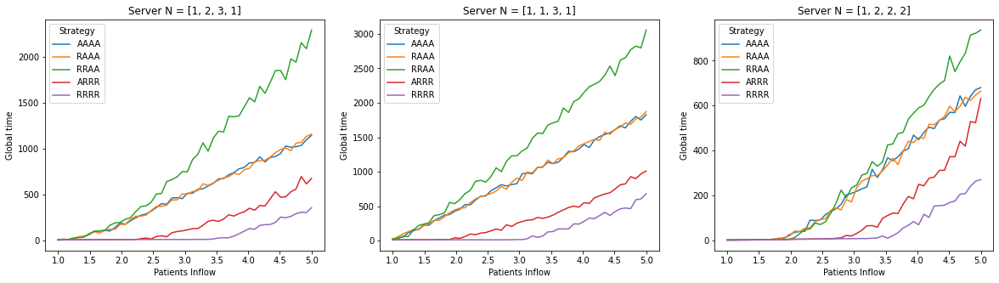

In [ ]:

%%time
N_lim= 8
fig, axs = plt.subplots(ncols=3, figsize=(20, 5))
global_plot_time_filtered([1,2,3,1], axs[0], mu=0.5, N_lim=N_lim)
global_plot_time_filtered([1,1,3,1], axs[1], mu=0.5, N_lim=N_lim)
global_plot_time_filtered([1,2,2,2], axs[2], mu=0.5, N_lim=N_lim)

### Вариант где 4 госпиталя рядом 


In [ ]:
hospitals = pd.read_csv('/content/unique_addresses_to.csv')

In [ ]:
hospitals["color"] = 2

In [ ]:
hospitals["size"] = 16

In [ ]:
hospitals

,Unnamed: 0,Lon,Lat,Address,color,size
0,0,30.250614,59.930178,"Большой просп. ВО, 85",2,16
1,1,30.363820,59.873704,"Будапештская, 3",2,16
2,2,30.390563,60.024752,"Вавиловых, 14",2,16
3,3,30.279864,59.972699,"Динамо пр., 3",2,16
4,4,30.321195,59.921804,"Загородный просп., 47",2,16
5,5,30.295701,59.849212,"Костюшко, 2",2,16
6,6,30.332577,59.871432,"Кузнецовская, 25",2,16
7,7,30.349456,59.935070,"Литейный просп., 56",2,16
8,8,30.360164,60.036281,"Луначарского пр., 47",2,16
9,9,30.321860,59.965309,"Льва Толстого, 6/8",2,16


In [ ]:
fig = px.scatter_mapbox(df, 
                        lat="lat", 
                        lon="lon", 
                        #color="counts",
                        #color_continuous_scale=color_scale,
                        #size="counts",
                        zoom=8, 
                        height=800,
                        width=800)
fig2 = px.scatter_mapbox(hospitals, lat="Lat", lon="Lon",zoom=8, color = hospitals["color"], size = hospitals["size"])
fig.add_trace(fig2.data[0]) # adds the line trace to the first figure
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

H1 - 7	30.349456	59.935070	Литейный просп., 56 \\
H2 - 15	30.490114	59.928280	Солидарности просп., 4 \\
H3 - 11	30.468124	59.879137	Народная, 21 \\
H4 - 1	30.363820	59.873704	Будапештская, 3

In [ ]:
data_new = data[data['lat'] <= 59.935070]

In [ ]:
 data_new = data_new[data_new['lon'] <= 30.490114]

In [ ]:
data_new = data_new[data_new['lat'] >= 59.873704]

In [ ]:
data_new = data_new[data_new['lon'] >= 30.349456]

In [ ]:
data_new

,index,adress,lat,lon,final,norm_lat,norm_lon
6,6,Народная 5 кв 62,59.877321,30.461341,ГБ №17,0.269603,0.502317
41,41,Дыбенко 23-1-169,59.903959,30.473046,ГБ №17,0.297875,0.507515
72,72,Тамбовская 75-81,59.907762,30.350588,ГВВ,0.301911,0.453138
73,73,Дж Рида 4-2-172,59.921349,30.447606,ГБ №17,0.316331,0.496219
76,76,Будапешская 4-618,59.874815,30.370791,НИИ СП им. Джанелидзе,0.266944,0.462109
...,...,...,...,...,...,...,...
5088,5088,Бухарестская 72-1-196,59.874851,30.377439,ГБ №26,0.266982,0.465061
5095,5095,Невский 128 кв 37,59.930669,30.366443,ГБ №16,0.326222,0.460179
5114,5114,"Новосёлов ул., 31 - 30",59.884099,30.465932,ГВВ,0.276797,0.504356
5115,5115,"Большевиков пр., д.71. к.1",59.877990,30.478760,ГБ №17,0.270313,0.510052


In [ ]:
fig = px.scatter_mapbox(data_new, 
                        lat="lat", 
                        lon="lon", 
                        #color="counts",
                        #color_continuous_scale=color_scale,
                        #size="counts",
                        zoom=8, 
                        height=800,
                        width=800)
fig2 = px.scatter_mapbox(hospitals, lat="Lat", lon="Lon",zoom=8, color = hospitals["color"], size = hospitals["size"])
fig.add_trace(fig2.data[0]) # adds the line trace to the first figure
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
def round_simulation_notnormalized(num_rounds, l, strategy, generate_patient, num_servers, mu, utility, hospital_location):
  total_patients = 0
  # utility: maps hospital to number
  h1 = Hospital(8, num_servers[0], hospital_location[0], strategy[0], mu)
  h2 = Hospital(8, num_servers[1], hospital_location[1], strategy[1], mu)
  h3 = Hospital(8, num_servers[2], hospital_location[2], strategy[2], mu)
  h4 = Hospital(8, num_servers[3], hospital_location[3], strategy[3], mu)
  for i in range(num_rounds):
    num_patients = poisson.rvs(mu=l, size=1)[0] # poisson with parameter l
    total_patients += num_patients
    for j in range(num_patients):
      patient = generate_patient()
      all_hospitals = [(h1, manch_distance(patient, h1.location)),
                       (h2, manch_distance(patient, h2.location)),
                       (h3, manch_distance(patient, h3.location)),
                       (h4, manch_distance(patient, h4.location))]
      all_hospitals_sorted = sorted(all_hospitals, key = lambda variable: variable[1])
      found_hospitals = False
      for h in all_hospitals_sorted:
        if h[0].accept():
          h[0].sent_patient(patient)
          found_hospitals = True
          break
      if not found_hospitals:
        all_hospitals_sorted[0][0].sent_patient(patient)
    h1.next_round()
    h2.next_round()
    h3.next_round()
    h4.next_round()
  return [[utility(h1), utility(h2), utility(h3), utility(h4)], (h1.surv_number() + h2.surv_number() + h3.surv_number() + h4.surv_number())/total_patients, (h1.total_time + h2.total_time + h3.total_time + h4.total_time)/total_patients]

In [ ]:
data_new

,index,adress,lat,lon,final,norm_lat,norm_lon
6,6,Народная 5 кв 62,59.877321,30.461341,ГБ №17,0.269603,0.502317
41,41,Дыбенко 23-1-169,59.903959,30.473046,ГБ №17,0.297875,0.507515
72,72,Тамбовская 75-81,59.907762,30.350588,ГВВ,0.301911,0.453138
73,73,Дж Рида 4-2-172,59.921349,30.447606,ГБ №17,0.316331,0.496219
76,76,Будапешская 4-618,59.874815,30.370791,НИИ СП им. Джанелидзе,0.266944,0.462109
...,...,...,...,...,...,...,...
5088,5088,Бухарестская 72-1-196,59.874851,30.377439,ГБ №26,0.266982,0.465061
5095,5095,Невский 128 кв 37,59.930669,30.366443,ГБ №16,0.326222,0.460179
5114,5114,"Новосёлов ул., 31 - 30",59.884099,30.465932,ГВВ,0.276797,0.504356
5115,5115,"Большевиков пр., д.71. к.1",59.877990,30.478760,ГБ №17,0.270313,0.510052


In [ ]:
coordinates_parts_one = data_new[['lat', 'lon']].to_numpy()

In [ ]:
len(coordinates_parts_one)

384

In [ ]:
def generate_real_patient_parts_one():
  rng = np.random.default_rng()
  one_hospital = rng.choice(coordinates_parts_one, 1)
  return one_hospital[0]

In [ ]:
def generate_matrix_parts_one(num_roundes, num_patients, num_servers, mu, generate_patient_function, utility, hospital_location):
  matrix = np.array([[[[round_simulation_notnormalized(num_roundes,num_patients, 'AAAA', generate_patient_function, num_servers, mu, utility, hospital_location )[0], round_simulation_notnormalized(num_roundes,num_patients, 'AAAR', generate_patient_function, num_servers, mu , utility, hospital_location)[0]], [round_simulation_notnormalized(num_roundes,num_patients, 'AARA', generate_patient_function, num_servers, mu, utility, hospital_location )[0], round_simulation_notnormalized(num_roundes,num_patients, 'AARR', generate_patient_function, num_servers, mu, utility, hospital_location )[0]]],
                            [[round_simulation_notnormalized(num_roundes,num_patients, 'ARAA', generate_patient_function, num_servers, mu, utility, hospital_location )[0], round_simulation_notnormalized(num_roundes,num_patients, 'ARAR', generate_patient_function, num_servers, mu , utility, hospital_location)[0]], [round_simulation_notnormalized(num_roundes,num_patients, 'ARRA', generate_patient_function, num_servers, mu, utility, hospital_location )[0], round_simulation_notnormalized(num_roundes,num_patients, 'ARRR', generate_patient_function, num_servers, mu, utility, hospital_location )[0]]]],
                           [[[round_simulation_notnormalized(num_roundes,num_patients, 'RAAA', generate_patient_function, num_servers, mu, utility, hospital_location )[0], round_simulation_notnormalized(num_roundes,num_patients,  'RAAR', generate_patient_function, num_servers, mu, utility, hospital_location )[0]], [round_simulation_notnormalized(num_roundes,num_patients, 'RARA', generate_patient_function, num_servers, mu, utility, hospital_location )[0], round_simulation_notnormalized(num_roundes,num_patients, 'RARR', generate_patient_function, num_servers, mu, utility, hospital_location )[0]]],
                            [[round_simulation_notnormalized(num_roundes,num_patients, 'RRAA', generate_patient_function, num_servers, mu, utility, hospital_location )[0], round_simulation_notnormalized(num_roundes,num_patients,  'RRAR', generate_patient_function, num_servers, mu, utility, hospital_location )[0]], [round_simulation_notnormalized(num_roundes,num_patients, 'RRRA', generate_patient_function, num_servers, mu, utility, hospital_location )[0], round_simulation_notnormalized(num_roundes,num_patients, 'RRRR', generate_patient_function, num_servers, mu, utility, hospital_location )[0]]]]])
  return matrix


In [ ]:
def find_solution_parts_one(l, mu, n, hospital_location):
    G = generate_matrix_parts_one(num_roundes , l, n, mu,generate_real_patient_parts_one,  lambda hospital: hospital.utility_simple(), hospital_location)
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def find_solution_parts_one_m1y(l, mu, n, hospital_location):
    G = generate_matrix_parts_one(num_roundes , l, n, mu,generate_real_patient_parts_one,  lambda hospital: hospital.utility_M1Y(), hospital_location)
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

In [ ]:
def find_solution_parts_one_very_high_M1Y(l, mu, n, hospital_location):
    G = generate_matrix_parts_one(num_roundes , l, n, mu,generate_real_patient_parts_one,  lambda hospital: hospital.utility_very_high_M1Y(), hospital_location)
    for first_h in [0,1]:
      for second_h in [0,1]:
        for third_h in [0,1]:
          for forth_h in [0,1]:
            if is_equilibrium(G, [first_h, second_h, third_h, forth_h]) == True: # g has an equilibrium
                return number_to_letter([first_h, second_h, third_h, forth_h])
    return 'Inconsistent'

H1 - 7 30.349456 59.935070 Литейный просп., 56 \\
H2 - 15 30.490114 59.928280 Солидарности просп., 4 \\
H3 - 11 30.468124 59.879137 Народная, 21 \\
H4 - 1 30.363820 59.873704 Будапештская, 3

In [ ]:
def solution_plot_parts_one(n, ax=None, legend=False, hospital_location = [[30.349456, 59.935070], [30.490114, 59.928280], [30.468124, 59.879137], [30.363820, 59.873704]] ):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_parts_one(l, mu, n, hospital_location))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Initial Solution Plot')
    if ax is not None:
        ax.set_title('N = ' + str(n))

In [ ]:
def solution_plot_parts_one_very_high_M1Y(n, ax=None, legend=False, hospital_location = [[30.349456, 59.935070], [30.490114, 59.928280], [30.468124, 59.879137], [30.363820, 59.873704]] ):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_parts_one_very_high_M1Y(l, mu, n, hospital_location))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Solution Plot with Finantial Model with penalty = 0.25')
    if ax is not None:
        ax.set_title('N = ' + str(n))

In [ ]:
def solution_plot_parts_one_m1y(n, ax=None, legend=False, hospital_location = [[30.349456, 59.935070], [30.490114, 59.928280], [30.468124, 59.879137], [30.363820, 59.873704]] ):
    data = {
        'Lambda': [],
        'Mu': [],
        'Nash Equilibrium': []
    }
    for l in np.linspace(0.5, 2, 50):
        for mu in np.linspace(0.5, 2, 50):
            data['Lambda'].append(l)
            data['Mu'].append(mu)
            data['Nash Equilibrium'].append(find_solution_parts_one_m1y(l, mu, n, hospital_location))
    data  = pd.DataFrame(data)
    sns.relplot(x='Lambda', y='Mu', hue='Nash Equilibrium', data=data, ax=ax,hue_order=hue_order, legend=legend, s=100, palette=palette).set(title='Solution Plot with Finantial Model')
    if ax is not None:
        ax.set_title('N = ' + str(n))

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 1h 41min 25s


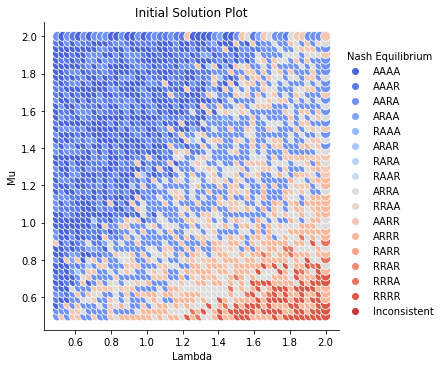

In [ ]:
%%time
solution_plot_parts_one([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 1h 26min 30s


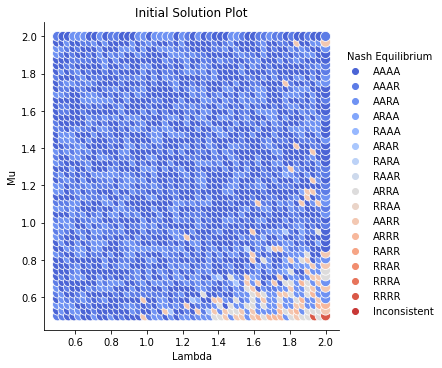

In [ ]:
%%time
solution_plot_parts_one([3,1,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 1h 23min 59s


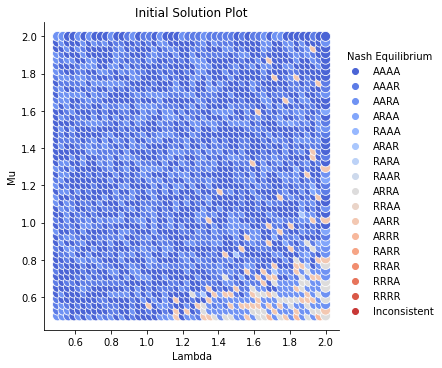

In [ ]:
%%time
solution_plot_parts_one([3,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


Wall time: 1h 25min 15s


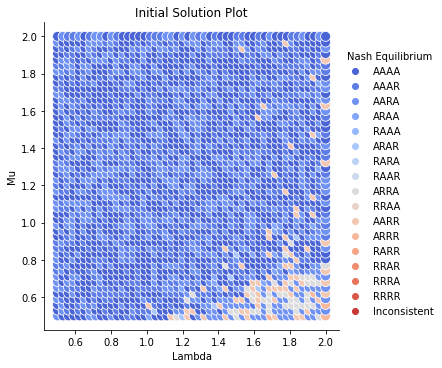

In [ ]:
%%time
solution_plot_parts_one([1,2,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


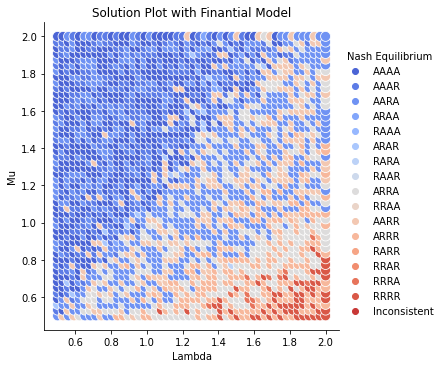

In [ ]:
solution_plot_parts_one_m1y([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


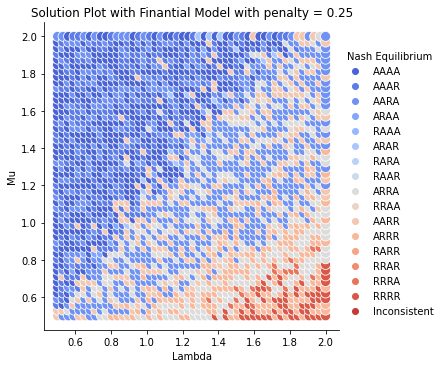

In [ ]:
solution_plot_parts_one_very_high_M1Y([1,1,1,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


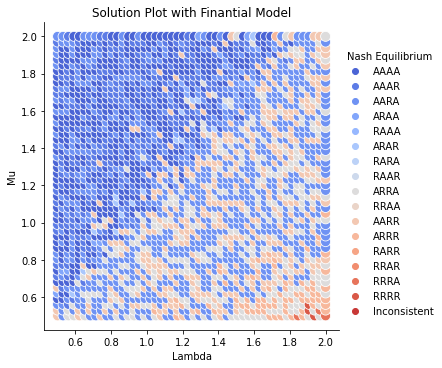

In [ ]:
solution_plot_parts_one_m1y([1,2,1,2], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


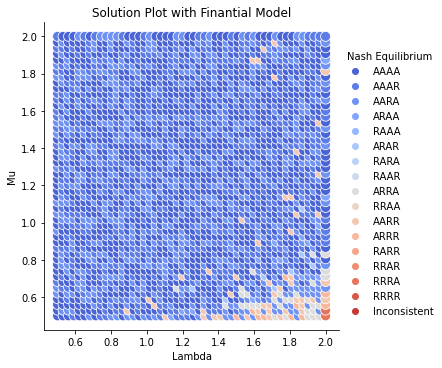

In [ ]:
solution_plot_parts_one_m1y([3,1,3,1], legend='brief')

c:\Users\79520\AppData\Local\Programs\Python\Python38\lib\site-packages\seaborn\relational.py:943: UserWarning: relplot is a figure-level function and does not accept the `ax` parameter. You may wish to try scatterplot
  warnings.warn(msg, UserWarning)


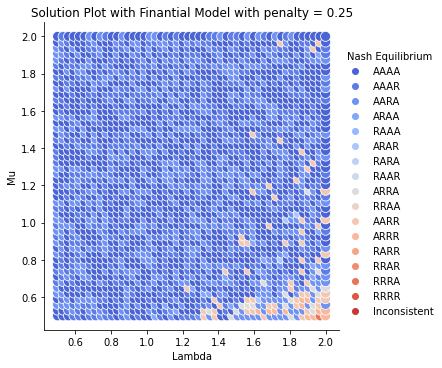

In [ ]:
solution_plot_parts_one_very_high_M1Y([3,1,3,1], legend='brief')

In [ ]:
solution_plot_parts_one_m1y([3,2,3,1], legend='brief')

KeyboardInterrupt: 

In [ ]:
solution_plot_parts_one_m1y([1,2,3,1], legend='brief')

#### Survival rate

In [ ]:
def global_plot_survival_parts_one(num_servers, ax, mu=1, N_lim=5, t_c=10, hospital_location = [[30.349456, 59.935070], [30.490114, 59.928280], [30.468124, 59.879137], [30.363820, 59.873704]] ):
    data = {
        'Patients Inflow': [],
        'Survival rate': [],
        'Strategy': []
    }
    l_space = np.linspace(1, 2, 50)
    desired_strategies = ['AAAA', 'RAAA', 'RRAA', 'ARRR','RRRR']
    for l in l_space:
        for strat in desired_strategies:
            data['Patients Inflow'].append(l)
            data['Survival rate'].append(round_simulation_notnormalized(num_roundes, l, strat, generate_real_patient_parts_one,num_servers, mu,lambda hospital : hospital.utility_simple(), hospital_location)[1])
            data['Strategy'].append(strat)

        
        
    data = pd.DataFrame(data)
    sns.lineplot(x="Patients Inflow", y="Survival rate", hue="Strategy", data=data, ax=ax)
    ax.set_title('Server N = ' + str(num_servers))

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


Wall time: 2min


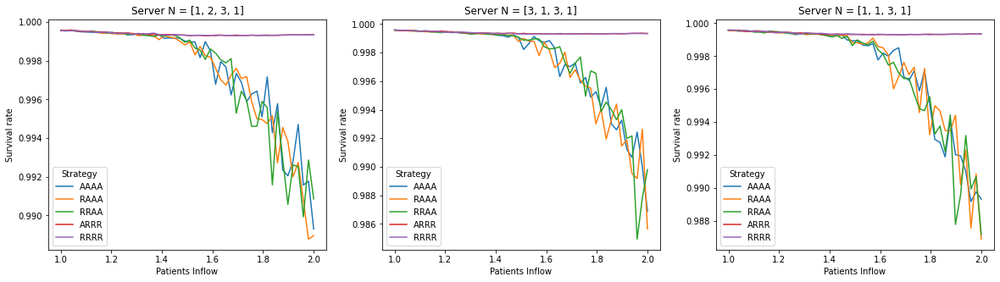

In [ ]:
%%time
N_lim= 8
fig, axs = plt.subplots(ncols=3, figsize=(20, 5))
global_plot_survival_parts_one([1,2,3,1], axs[0], mu=0.5, N_lim=N_lim)
global_plot_survival_parts_one([3,1,3,1], axs[1], mu=0.5, N_lim=N_lim)
global_plot_survival_parts_one([1,1,3,1], axs[2], mu=0.5, N_lim=N_lim)

In [ ]:
def global_plot_time_parts_one(num_servers, ax, mu=1, N_lim=5, t_c=10, hospital_location = [[30.349456, 59.935070], [30.490114, 59.928280], [30.468124, 59.879137], [30.363820, 59.873704]]):
    data = {
        'Patients Inflow': [],
        'Global time': [],
        'Strategy': []
    }
    l_space = np.linspace(1, 5, 50)
    desired_strategies = ['AAAA', 'RAAA', 'RRAA', 'ARRR', 'RRRR']
    for l in l_space:
        for strat in desired_strategies:
            data['Patients Inflow'].append(l)
            data['Global time'].append(round_simulation_notnormalized(num_roundes, l, strat, generate_real_patient_parts_one,num_servers, mu,lambda hospital : hospital.utility_simple(), hospital_location)[2])
            data['Strategy'].append(strat)

        
        
    data = pd.DataFrame(data)
    sns.lineplot(x="Patients Inflow", y="Global time", hue="Strategy", data=data, ax=ax)
    ax.set_title('Server N = ' + str(num_servers))

Wall time: 2min 58s


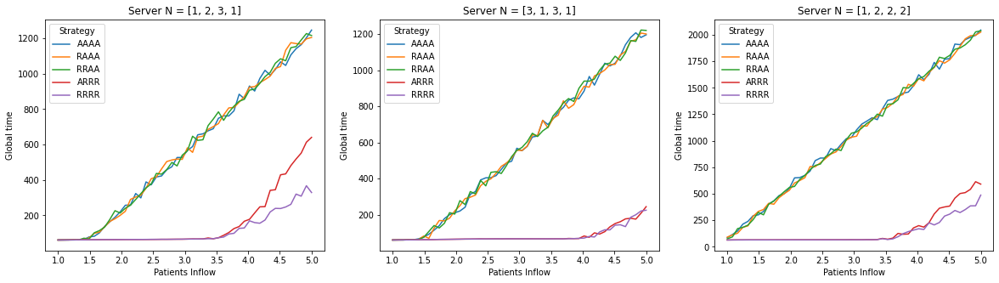

In [ ]:
%%time
N_lim= 8
fig, axs = plt.subplots(ncols=3, figsize=(20, 5))
global_plot_time_parts_one([1,2,3,1], axs[0], mu=0.5, N_lim=N_lim)
global_plot_time_parts_one([3,1,3,1], axs[1], mu=0.5, N_lim=N_lim)
global_plot_time_parts_one([1,2,2,2], axs[2], mu=0.5, N_lim=N_lim)